# Image Embeddings for Domain-Independent Image Retrieval



# Setup Python dependencies

In [ ]:
!pip install open_clip_torch ftfy --no-deps

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 21.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 1.8 MB/s eta 0:00:00


In [ ]:
!git clone https://github.com/Visual-Computing/GPR1200.git
%cd GPR1200/eval/

Cloning into 'GPR1200'...
remote: Enumerating objects: 114, done.
remote: Counting objects: 100% (47/47), done.
remote: Compressing objects: 100% (33/33), done.
remote: Total 114 (delta 22), reused 32 (delta 14), pack-reused 67 (from 1)
Receiving objects: 100% (114/114), 4.34 MiB | 11.60 MiB/s, done.
Resolving deltas: 100% (50/50), done.
/content/GPR1200/eval


# Download and load the GRP1200 dataset

This dataset consists of 12,000 images spanning 1,200 diverse and distinct classes.

In [ ]:
import os
import zipfile
import numpy as np
import matplotlib.pyplot as plt

from PIL import Image
from tqdm import tqdm
from concurrent.futures import ThreadPoolExecutor
from huggingface_hub import hf_hub_download

from utils import get_sorted_distances
from GPR1200 import GPR1200

In [ ]:
# Download dataset
repo_id = "Visual-Computing-Group/GPR1200"
filename = "GPR1200.zip"
file_path = hf_hub_download(repo_id=repo_id, filename=filename, repo_type="dataset")
print(f"Dataset downloaded to: {file_path}")

# Unzip dataset
extract_dir = "/content/GPR1200/dataset/"
with zipfile.ZipFile(file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)
print(f"Extracted to: {extract_dir}")

# Load dataset
GPR1200_dataset = GPR1200("../dataset/images/")
print(f"Found {len(GPR1200_dataset.image_files)} image files")

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


GPR1200.zip:   0%|          | 0.00/1.25G [00:00<?, ?B/s]

Dataset downloaded to: /root/.cache/huggingface/hub/datasets--Visual-Computing-Group--GPR1200/snapshots/a7c3ec7870a22b66c2eaa5ddc4243037886ef541/GPR1200.zip
Extracted to: /content/GPR1200/dataset/
Found 12000 image files


# Color-Based Embedding Search

Resize the image to 5x5 pixels and use the resulting RGB values as a basic color-based image embedding.

In [ ]:
def process_image(file_path):
    try:
        # Open the image
        image = Image.open(file_path).convert("RGB")

        # Resize the image to 5x5
        resized_image = image.resize((5, 5))

        # Convert image to numpy array and flatten
        return np.array(resized_image).flatten()
    except Exception as e:
        print(f"Skipping {file_path}: {e}")
        return None

def extract_color_embeddings(image_files, num_workers=4):

    feature_vectors = [None] * len(image_files)  # Maintain order

    # Use ThreadPoolExecutor for parallel processing
    with ThreadPoolExecutor(max_workers=num_workers) as executor:
        results = list(tqdm(executor.map(process_image, image_files), total=len(image_files), desc="Processing images"))

    # Assign results in order
    for i, result in enumerate(results):
        if result is not None:
            feature_vectors[i] = result

    # Convert to a NumPy array
    return np.array([vec for vec in feature_vectors if vec is not None])

In [ ]:
color_embeddings = extract_color_embeddings(GPR1200_dataset.image_files)
gpr, lm, iNat, ims, instre, sop, faces = GPR1200_dataset.evaluate(color_embeddings, metric="L2", compute_partial=True)
print("GPR1200 mAP: {}".format(gpr))

Processing images: 100%|██████████| 12000/12000 [01:03<00:00, 189.50it/s]


GPR1200 mAP: 0.1511


Select a few images from the dataset as queries and find similar images by comparing their color embeddings.

In [ ]:
def plot_nn(top_indices, image_paths, k=10):

    fig, axes = plt.subplots(1, k + 1, figsize=(15, 2))
    # Plot top 10 results
    for j in range(1, k + 1):
        image = Image.open(image_paths[top_indices[j-1]]).convert("RGB").resize((300, 300))
        axes[j].imshow(image)


    # Turn off axis labels
    for ax in axes:
        ax.axis('off')

    plt.tight_layout()
    plt.show()

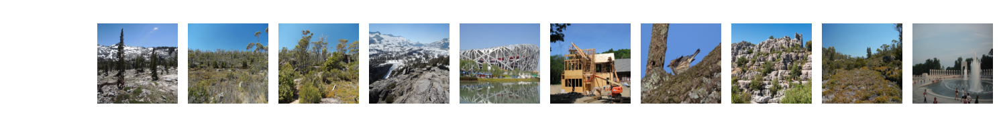

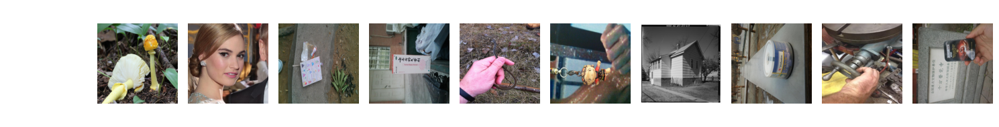

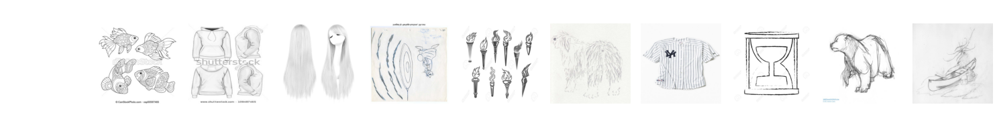

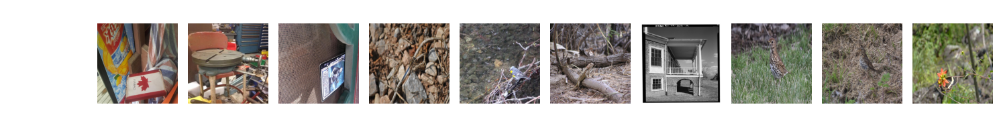

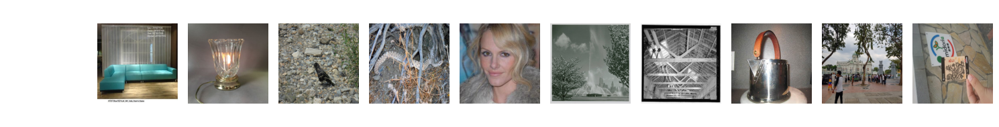

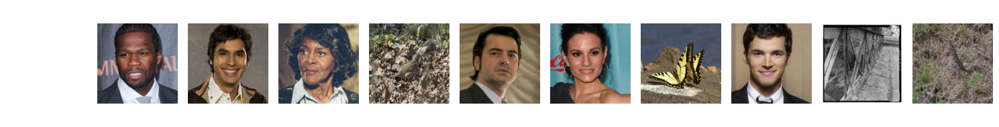

In [ ]:
_, nn_indices = get_sorted_distances(color_embeddings, color_embeddings[::2000], k=10, metric="L2")
for nn_indx in nn_indices:
  plot_nn(nn_indx, GPR1200_dataset.image_files)

# MCIP Fine-Tuned SigLIP

First, load the standard SigLIP model from Open CLIP and replace its weights with the fine-tuned ones from MCIP.

In [ ]:
import open_clip
import torch

In [ ]:
# Preprocessing that will be run on each individuall test image
def ppc_image(path, transform):

    with open(path, 'rb') as f:
        img = Image.open(f)
        img = img.convert('RGB')

    img = transform(img)

    return img

# dataloader parameters
batch_size = 128
params = {'batch_size': batch_size,
      'shuffle': False,
      'num_workers': 2}

class TestDataset(torch.utils.data.Dataset):
  'Characterizes a dataset for PyTorch'
  def __init__(self, file_paths, transform):
        'Initialization'
        self.file_paths = file_paths
        self.transform = transform

  def __len__(self):
        'Denotes the total number of samples'
        return len(self.file_paths)

  def __getitem__(self, index):
        'Generates one sample of data'
        # Select sample
        return ppc_image(self.file_paths[index], self.transform)

In [ ]:
# CUDA for PyTorch
use_cuda = torch.cuda.is_available()
device = torch.device("cuda:0" if use_cuda else "cpu")
device

device(type='cuda', index=0)

In [ ]:
# Load the Open CLIP model
clip_model, _, val_transform = open_clip.create_model_and_transforms("ViT-SO400M-14-SigLIP-384", pretrained="webli")
clip_model.to(device)
clip_model.eval();

open_clip_model.safetensors:   0%|          | 0.00/3.51G [00:00<?, ?B/s]

In [ ]:
# Download MCIP Fune-Tuned SigLIP weight from Hugging Face
repo_id = "Visual-Computing-Group/MCIP-ViT-SO400M-14-SigLIP-384"
filename = "MCIP-ViT-SO400M-14-SigLIP-384.pth"
checkpoint_path = hf_hub_download(repo_id=repo_id, filename=filename)

# Replace weights default weights with MCIP weights
mcip_state_dict = torch.load(checkpoint_path)
clip_model.load_state_dict(mcip_state_dict, strict=True)

MCIP-ViT-SO400M-14-SigLIP-384.pth:   0%|          | 0.00/3.51G [00:00<?, ?B/s]

<All keys matched successfully>

## Compute image embedding using MCIP Fine-Tuned SigLIP

Compute the image embeddings for the GPR1200 dataset and select once again a few images from the dataset as queries and find similar images by comparing their embeddings.

In [ ]:
gpr1200_loader = torch.utils.data.DataLoader(TestDataset(GPR1200_dataset.image_files, val_transform), **params)
pbar = tqdm(enumerate(gpr1200_loader), position=0, leave=True, total=(int(len(GPR1200_dataset.image_files) / batch_size)))

mcip_embeddings = []
with torch.amp.autocast('cuda'):
  with torch.set_grad_enabled(False):
      for i, local_batch in pbar:

          local_batch = local_batch.to(device)
          fv = clip_model.encode_image(local_batch)

          fv = fv / torch.norm(fv, dim=-1, keepdim=True)

          mcip_embeddings += list(fv.cpu().numpy())
          pbar.update()

      print(fv.shape)

# display some addtional info
mcip_embeddings = np.array(mcip_embeddings).astype(float)

gpr, lm, iNat, ims, instre, sop, faces = GPR1200_dataset.evaluate(mcip_embeddings, compute_partial=True)
print("MCIP SigLIP GPR1200 mAP: {}".format(gpr))

94it [10:52,  6.94s/it] 


torch.Size([96, 1152])
MCIP SigLIP GPR1200 mAP: 0.8872


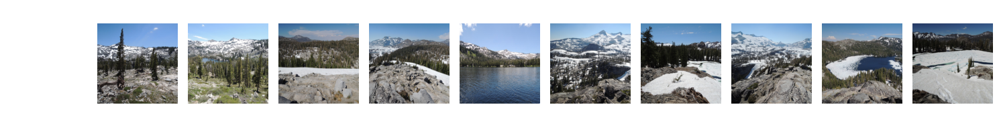

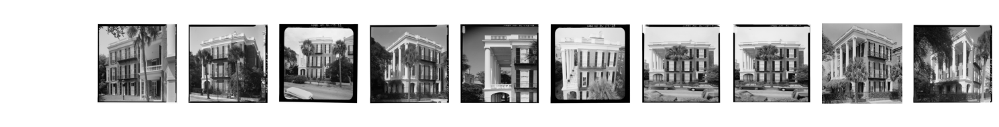

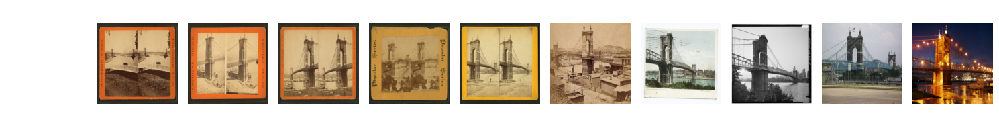

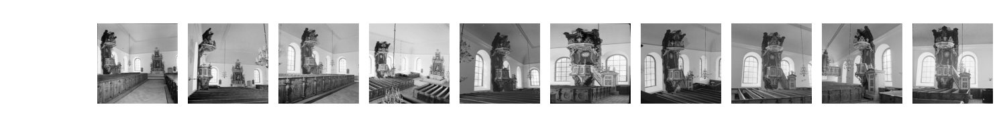

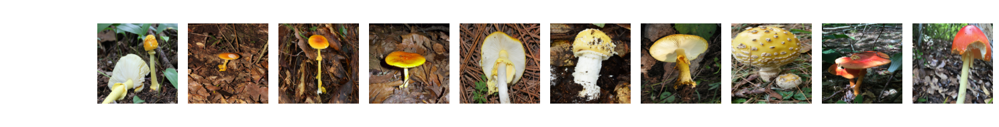

...

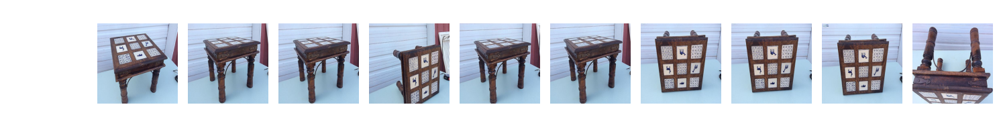

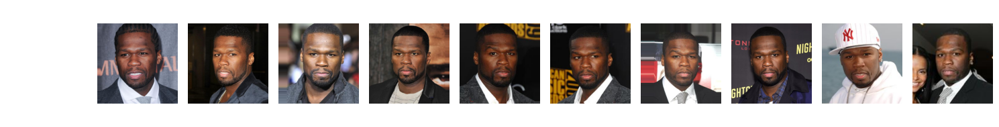

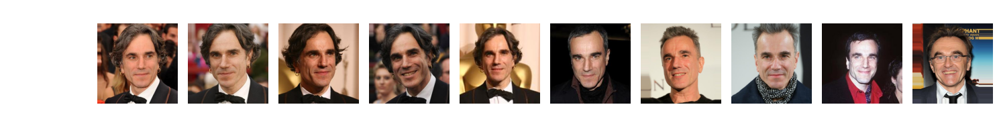

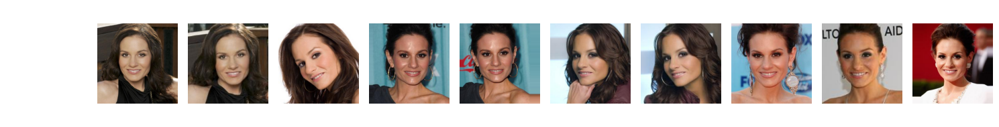

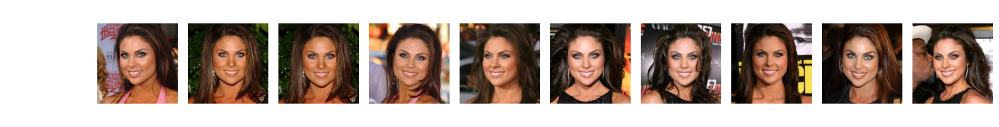

In [ ]:
_, nn_indices_mcip = get_sorted_distances(mcip_embeddings, mcip_embeddings[::500], k=10)
for i, nn_indx in enumerate(nn_indices_mcip):
  plot_nn(nn_indices_mcip[i], GPR1200_dataset.image_files)

# Text-to-Image Search

Load the tokenizer of the SigLIP model to process text. Use a text query to find images.

In [ ]:
tokenizer = open_clip.get_tokenizer('ViT-SO400M-14-SigLIP-384')

tokenizer_config.json:   0%|          | 0.00/20.6k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.42M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/2.20k [00:00<?, ?B/s]

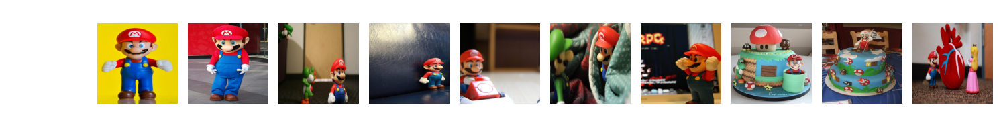

In [ ]:
text_query = "super mario"
tokens = tokenizer([text_query])

with torch.amp.autocast('cuda'):
  with torch.set_grad_enabled(False):
    text_query_embedding = clip_model.encode_text(tokens.to(device))

text_query_embedding = (text_query_embedding / torch.norm(text_query_embedding, dim=-1, keepdim=True)).cpu().numpy()
_, nn_indices_text_search = get_sorted_distances(mcip_embeddings, text_query_embedding, k=10)
plot_nn(nn_indices_text_search[0], GPR1200_dataset.image_files)